# 🧬 Desafio: Visualização de Grupos Celulares por Expressão Gênica com t-SNE

Você é um pesquisador de bioinformática encarregado de analisar a expressão gênica de células individuais a partir de um experimento de sequenciamento sintético. O objetivo é investigar se **os diferentes tipos celulares** presentes no conjunto de dados podem ser **identificados visualmente** com base apenas na expressão dos genes.

---

## 🧪 O Dataset

Você receberá um dataset sintético com as seguintes características:

- **Linhas**: Cada linha representa uma **célula**.
- **Colunas**:  
  - `gene_1`, `gene_2`, ..., `gene_50`: Níveis de expressão de 50 genes.  
  - `cell_type`: Tipo celular ao qual a célula pertence (rótulo conhecido).

---

## 🎯 Objetivo do Desafio

Aplique o algoritmo de **t-SNE** para reduzir a dimensionalidade dos dados de expressão gênica (50 dimensões) para **2 dimensões**. Em seguida:

1. **Plote um gráfico 2D** com os resultados do t-SNE, usando:
   - O **eixo X** para o componente 1.
   - O **eixo Y** para o componente 2.
   - A **cor** dos pontos representando o `cell_type`.

2. Analise visualmente se os diferentes tipos celulares formam **agrupamentos claros e distintos** no espaço projetado.


In [86]:
# EDA e Visualizacao de Dados
import pandas as pd
import matplotlib.pyplot as plt
import plotly.express as px
import seaborn as sns

# ML / T-sne
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.manifold import TSNE

# Leitura do dataset

In [87]:
# Carregar dataframe
df = pd.read_csv('datasets/synthetic_cell_data.csv')

In [88]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1200 entries, 0 to 1199
Data columns (total 51 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   gene_1     1200 non-null   float64
 1   gene_2     1200 non-null   float64
 2   gene_3     1200 non-null   float64
 3   gene_4     1200 non-null   float64
 4   gene_5     1200 non-null   float64
 5   gene_6     1200 non-null   float64
 6   gene_7     1200 non-null   float64
 7   gene_8     1200 non-null   float64
 8   gene_9     1200 non-null   float64
 9   gene_10    1200 non-null   float64
 10  gene_11    1200 non-null   float64
 11  gene_12    1200 non-null   float64
 12  gene_13    1200 non-null   float64
 13  gene_14    1200 non-null   float64
 14  gene_15    1200 non-null   float64
 15  gene_16    1200 non-null   float64
 16  gene_17    1200 non-null   float64
 17  gene_18    1200 non-null   float64
 18  gene_19    1200 non-null   float64
 19  gene_20    1200 non-null   float64
 20  gene_21 

In [89]:
# Visualizar os primeiros registros
df_cosmeticos.head(10)

,gene_1,gene_2,gene_3,gene_4,gene_5,gene_6,gene_7,gene_8,gene_9,gene_10,...,gene_42,gene_43,gene_44,gene_45,gene_46,gene_47,gene_48,gene_49,gene_50,cell_type
0,-2.645739,1.084029,1.033785,-0.492039,2.031826,-1.577436,-3.064917,7.414324,5.415871,-0.189912,...,3.113416,2.623661,-3.358139,4.445828,-1.543928,0.403476,4.233371,2.028571,1.281061,type_4
1,2.501869,-2.607423,0.254079,1.983542,-12.577327,3.643290,0.662070,2.639538,-0.270477,-0.060948,...,-0.713175,-4.108856,12.761196,-0.492549,-0.567835,0.541446,0.951115,5.316995,-2.845845,type_0
2,0.867952,6.024128,-0.025372,-0.639283,-6.976072,-4.469016,-0.079012,-0.494158,-0.422986,-0.397785,...,-0.885718,5.124325,-7.550761,-1.299736,-0.676549,0.895681,2.608146,6.540721,-5.255593,type_1
3,-5.450764,-1.251932,1.479890,-0.006988,7.958121,-6.493759,5.254006,14.731454,1.216928,-0.161186,...,-2.450433,-0.817676,4.400203,3.912871,0.578546,0.101902,-0.678812,1.194707,-0.450927,type_4
4,1.646937,5.899848,1.712686,-0.267201,0.736141,-5.839495,4.971377,20.075666,2.032173,-1.333014,...,0.264370,-14.056835,-0.752921,-2.653600,-1.222040,0.774236,-0.751898,2.663342,11.293108,type_4
5,7.985732,2.028616,-2.108824,-0.507353,8.291373,-2.446036,4.601581,0.004283,-2.517259,1.081680,...,5.231475,-26.485388,12.911786,-0.047978,0.155614,0.198900,-6.363055,3.607347,5.009559,type_3
6,1.958809,2.266977,1.011023,-0.405092,-16.608731,-2.589556,-6.015156,18.677365,0.578499,0.991975,...,-2.334598,-13.740739,-19.491929,-4.538443,0.979981,-0.214577,3.325530,0.553118,-4.690824,type_2
7,2.874223,3.364924,-0.203000,1.035186,-6.790603,4.026036,-2.774885,-1.960487,1.612896,0.544958,...,4.415724,11.347547,-1.840424,1.171177,-0.407957,0.892767,-0.894967,-3.244944,2.463727,type_2
8,-0.512986,0.035735,-0.593628,1.303347,4.479463,1.273131,-1.787505,9.574000,4.306202,-0.531092,...,-9.036559,-6.628100,-7.619347,1.489295,-0.051405,0.670841,5.828608,5.832769,-4.367958,type_0
9,4.406530,4.170972,0.207299,1.343522,-30.853167,1.801622,3.651366,16.729529,3.913599,-1.534798,...,-1.297853,-27.112376,0.928715,-2.415031,-0.581861,-0.878507,0.295091,-0.311437,-4.465743,type_0


# EDA

In [90]:
df.describe()

,gene_1,gene_2,gene_3,gene_4,gene_5,gene_6,gene_7,gene_8,gene_9,gene_10,...,gene_41,gene_42,gene_43,gene_44,gene_45,gene_46,gene_47,gene_48,gene_49,gene_50
count,1200.000000,1200.000000,1200.000000,1200.000000,1200.000000,1200.000000,1200.000000,1200.000000,1200.000000,1200.000000,...,1200.000000,1200.000000,1200.000000,1200.000000,1200.000000,1200.000000,1200.000000,1200.000000,1200.000000,1200.000000
mean,0.269324,2.026219,0.015786,-0.028116,-2.122801,-0.490857,1.284298,5.828234,0.362583,0.011576,...,0.365303,0.228197,-4.467380,0.869411,0.351452,0.024154,-0.021449,-0.298270,1.336862,0.386345
std,3.775422,3.047931,1.019325,1.010042,10.841627,3.609355,3.468614,10.981872,3.652475,0.973866,...,3.694792,3.585006,12.248655,9.529351,3.733268,1.019383,1.010276,3.681659,3.565798,3.550924
min,-10.141897,-9.228910,-3.482768,-3.242987,-41.441590,-10.793123,-8.996350,-27.318668,-11.678312,-3.003106,...,-11.960700,-10.366488,-38.545817,-36.738775,-12.783092,-3.246233,-2.999714,-13.125571,-10.672461,-10.133236
25%,-2.421130,-0.046719,-0.649693,-0.686873,-9.392613,-2.998869,-1.287978,-1.725341,-2.108999,-0.648617,...,-2.127106,-2.097078,-12.919963,-5.672383,-2.275796,-0.671541,-0.702535,-2.838792,-1.001999,-2.067543
50%,0.184105,2.071347,0.015290,-0.046073,-2.297948,-0.570461,1.404739,5.651884,0.191376,0.007060,...,0.385808,0.083860,-4.561076,0.866118,0.198840,0.015510,-0.022558,-0.379001,1.540704,0.241216
75%,2.889395,4.047296,0.744118,0.629383,4.491653,1.843312,3.737431,13.200223,2.845956,0.700536,...,2.876378,2.840972,3.336691,7.170686,3.000446,0.720197,0.688822,2.221177,3.875756,2.864945
max,12.232814,13.086474,3.475239,3.175204,41.637061,10.616334,11.972265,46.421128,11.404758,3.076787,...,12.015285,10.727785,34.017735,39.138959,11.778587,3.313657,3.374655,11.040306,11.612362,12.975577


## Matriz de correlação

In [91]:
# Gerar Matriz de Correlação
matriz_correlacao_cosmeticos = df.corr(numeric_only=True)

<Axes: >

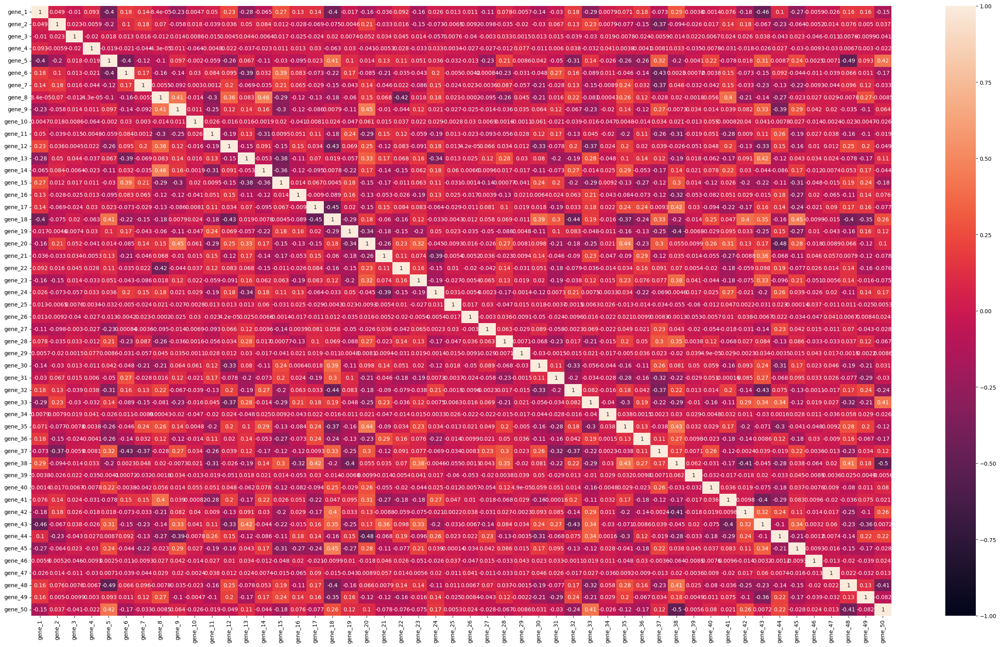

In [92]:
# Plotar matriz de correlação
plt.figure(figsize=(35, 20))
sns.heatmap(matriz_correlacao_cosmeticos, vmin=-1, vmax=1, annot=True)

In [93]:
import numpy as np

# Calcular a matriz de correlação (com valores negativos e positivos)
corr_matrix = matriz_correlacao_cosmeticos

# Pegar apenas a parte superior da matriz (sem a diagonal)
upper_tri = corr_matrix.where(np.triu(np.ones(corr_matrix.shape), k=1).astype(bool))

# Ordenar pelos maiores valores absolutos, mas mantendo o sinal original
top_corrs = upper_tri.stack().reindex(
    upper_tri.stack().abs().sort_values(ascending=False).index
).head(10)

print(top_corrs)


gene_38  gene_50   -0.499143
gene_5   gene_48   -0.492854
gene_20  gene_44   -0.482737
gene_8   gene_14    0.464962
gene_1   gene_43   -0.456296
gene_18  gene_45    0.453807
gene_17  gene_18   -0.453178
gene_9   gene_20    0.449876
gene_20  gene_35    0.444095
gene_18  gene_32   -0.436876
dtype: float64


## Gráficos para interpretação

### Histogramas

In [94]:
# Distribuição da variável gene_38
px.histogram(df['gene_38'], title='Distribuição da variável gene_38')

In [95]:
# Distribuição da variável gene_50
px.histogram(df['gene_50'], title='Distribuição da variável gene_50')

### Gráficos de Disperção

In [96]:
# Correlação Preço e Rating
px.scatter(df_cosmeticos, x='gene_38', y='gene_50', color='cell_type', hover_data=['cell_type', 'gene_38', 'gene_50'],
           title='Correlação entre gene_38 e gene_50 por Tipo Celular',)

In [97]:
# Correlação Preço e Rating
px.scatter(df_cosmeticos, x='gene_5', y='gene_48', color='cell_type', hover_data=['cell_type', 'gene_38', 'gene_50'],
           title='Correlação entre gene_38 e gene_50 por Tipo Celular',)

# Treinar o Algoritmo de t-SNE

In [98]:
# Copiar o dataframe original
X = df_cosmeticos.copy()
X.drop(columns=['cell_type'], axis=1, inplace=True)


In [99]:
# Separar as variáveis numéricas para normalização
num_features = X.select_dtypes(include=['float64', 'int64']).columns.tolist()

In [100]:
# Definir as transformações
numeric_transformcer = StandardScaler()

In [101]:
# Criar pre processor de transformação
preprocessor = ColumnTransformer(
    transformers=[
        ('num', numeric_transformcer, num_features),
    ],
    remainder='passthrough'
)

In [102]:
# Tranformar os dados
X_transformed = preprocessor.fit_transform(X)

In [103]:
X_transformed

array([[-0.77243764, -0.30925347,  0.99911555, ...,  1.23138234,
         0.19406509,  0.25207215],
       [ 0.59158306, -1.52089217,  0.23387275, ...,  0.33949527,
         1.11666232, -0.91061889],
       [ 0.15862546,  1.31222629, -0.04039477, ...,  0.78976021,
         1.45998971, -1.58952741],
       ...,
       [-1.1511887 ,  0.29350813, -0.53687154, ..., -0.71829898,
         0.49844215,  0.31968906],
       [ 0.58742701, -0.31050335, -1.6682397 , ..., -0.47976208,
         0.4266841 , -0.01311075],
       [ 0.47010141, -1.13816167, -0.33354413, ...,  1.60336574,
         0.14627282, -0.31349598]])

In [104]:
def tsne_results_calc(number_components=2):
    results_df = pd.DataFrame()

    # Loop de treinamento do algoritmo, mudando o parâmetro Perplexity
    for perplexity in range(2, 51, 1):

        # Criar e treinar modelo
        tsne = TSNE(n_components=number_components, perplexity=perplexity, init="random", n_iter=250, random_state=51)
        tsne_results = tsne.fit_transform(X_transformed)

        # Armazenar resultados
        temp_df = pd.DataFrame(tsne_results, columns=[f'Componente {i}' for i in range(1, number_components + 1)])
        temp_df['Perplexity'] = perplexity
        temp_df['cell_type'] = df_cosmeticos['cell_type'].values
        results_df = pd.concat([results_df, temp_df], axis=0)
    return results_df

In [105]:
# Armazenar resultados do t-SNE em Dataframe
results_df = tsne_results_calc()

In [106]:
# Armazenar resultados do t-SNE em Dataframe para 3 componentes
results_df_3d = tsne_results_calc(3)

In [107]:
results_df.head(10)

,Componente 1,Componente 2,Perplexity,cell_type
0,1.020129,0.636665,2,type_4
1,0.122131,1.557443,2,type_0
2,-1.559560,-1.600617,2,type_1
3,0.988956,0.377495,2,type_4
4,0.082561,0.561978,2,type_4
5,-1.336213,0.744535,2,type_3
6,0.842210,-1.619098,2,type_2
7,1.219820,-1.348064,2,type_2
8,0.313250,2.024270,2,type_0
9,0.366599,2.204322,2,type_0


In [108]:
results_df_3d.head(10)

,Componente 1,Componente 2,Componente 3,Perplexity,cell_type
0,-0.307257,-0.313517,1.094856,2,type_4
1,0.080969,-1.236636,0.277681,2,type_0
2,0.706297,1.718211,0.464952,2,type_1
3,-0.131212,-0.080439,1.294427,2,type_4
4,0.276490,-0.338431,0.274603,2,type_4
5,1.126302,-0.388718,-0.774206,2,type_3
6,-0.890600,0.628399,-0.789727,2,type_2
7,-1.098598,0.135921,-0.810785,2,type_2
8,-0.272114,-1.604712,0.157018,2,type_0
9,-0.485735,-1.746562,0.202345,2,type_0


## Visualizar Resultado

In [109]:
# Reset no Indice para realizar o plot
results_df.reset_index(drop=True, inplace=True)
results_df_3d.reset_index(drop=True, inplace=True)


In [110]:
# Criar um ScatterPlot Animado com variação do Perplexity
fig = px.scatter(results_df, x='Componente 1', y='Componente 2', animation_frame='Perplexity',
                 color='cell_type', title='Visualizacao do t-SNE com variação do Perplexity')
fig.show()

In [112]:
# Criar um ScatterPlot Animado com variação do Perplexity
fig = px.scatter_3d(results_df_3d, x='Componente 1', y='Componente 2', z='Componente 3', animation_frame='Perplexity',
                 color='cell_type', title='Visualizacao do t-SNE com variação do Perplexity')
fig.show()